In [1]:
import rasterio
import pyodbc
from rasterio.enums import Resampling
from rasterio.warp import reproject
from rasterio.windows import from_bounds
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from modules.tree_tops import *
import pandas as pd
from modules.field_data import *
from modules.merge import *
from modules.segmentation import * 


#### Calculate nDSM and/or define path to nDSM

In [2]:
# Path to save the nDSM
output_ndsm = r"D:\Drohnendaten\TEMP\Baumhoehen\EBE_151_nDSM_clipped_v3.tif"
#dsm_file = r"D:\Drohnendaten\TEMP\Baumhoehen\EBE_151_20240925_DSM_clipped_v3.tif"
#dtm_file = r"D:\Drohnendaten\TEMP\Baumhoehen\EBE_151_DTM_clipped_v3.tif"

#ndsm = calculate_ndsm(dsm_file, dtm_file, output_ndsm)

# Part 1: Simple tree top detection

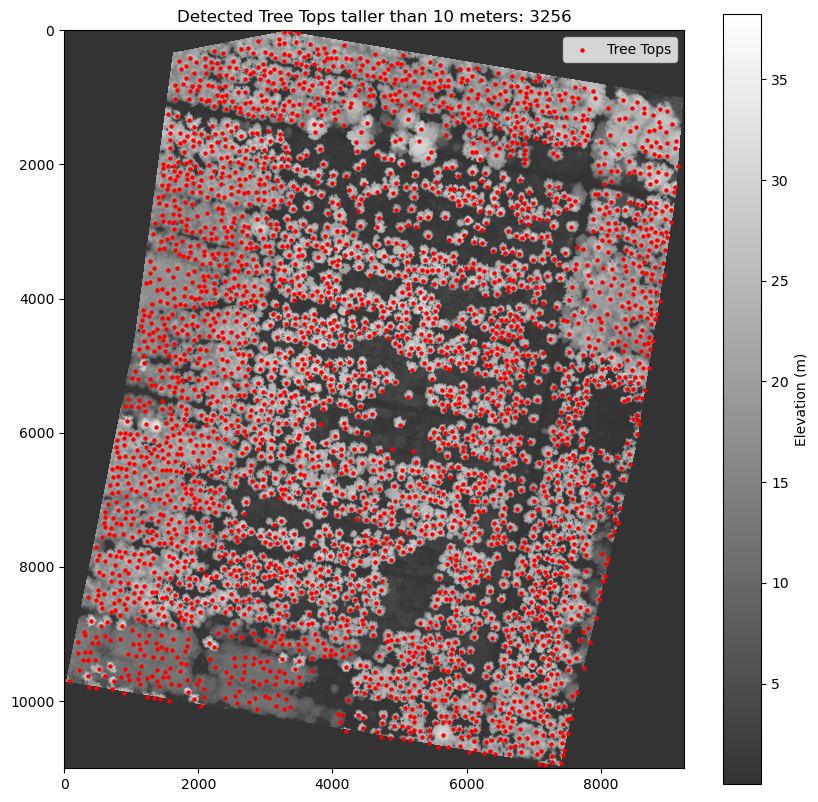

In [3]:
tree_top_values, fig, ax = detect_tree_tops(output_ndsm, neighborhood_size=100, min_height_threshold=10, sigma=2)

In [4]:
# Convert to DataFrame
#df = pd.DataFrame(tree_top_values, columns=["utm_x", "utm_y", "tree_height"])

# Save as CSV
#df.to_csv(r"C:\Users\lwfeckesim\Desktop\bernhard_uav_height\tree_tops.csv", index=False)


#### Check database connection

In [5]:
dsn_name = "ecke"  # Replace with your DSN name
versuch_id = 151   # Specify the Versuch ID

corners, trees = fetch_corners_and_trees(dsn_name, versuch_id)

Connected to the database successfully.
Data retrieved successfully.
Corner points retrieved: 144
Tree points retrieved: 1547


#### Calculate stem coordinates from local coordinate system

In [6]:
# Find ground lines for all Plots
ground_lines = find_ground_lines(corners)

In [7]:
# Compute the ground vector and perpendicular vector for all plots ("Parzellen")
ground_vectors = {}
perpendicular_vectors = {}

for parzelle, (utm_lower_left, utm_lower_right) in ground_lines.items():
    # Compute the ground vector for the current Parzelle
    ground_vector = np.array([utm_lower_right[0] - utm_lower_left[0], utm_lower_right[1] - utm_lower_left[1]])
    ground_length = np.linalg.norm(ground_vector)
    unit_ground_vector = ground_vector / ground_length

    # Compute the perpendicular vector for the current Parzelle
    perpendicular_vector = np.array([-unit_ground_vector[1], unit_ground_vector[0]])

    # Store the results in dictionaries
    ground_vectors[parzelle] = unit_ground_vector
    perpendicular_vectors[parzelle] = perpendicular_vector


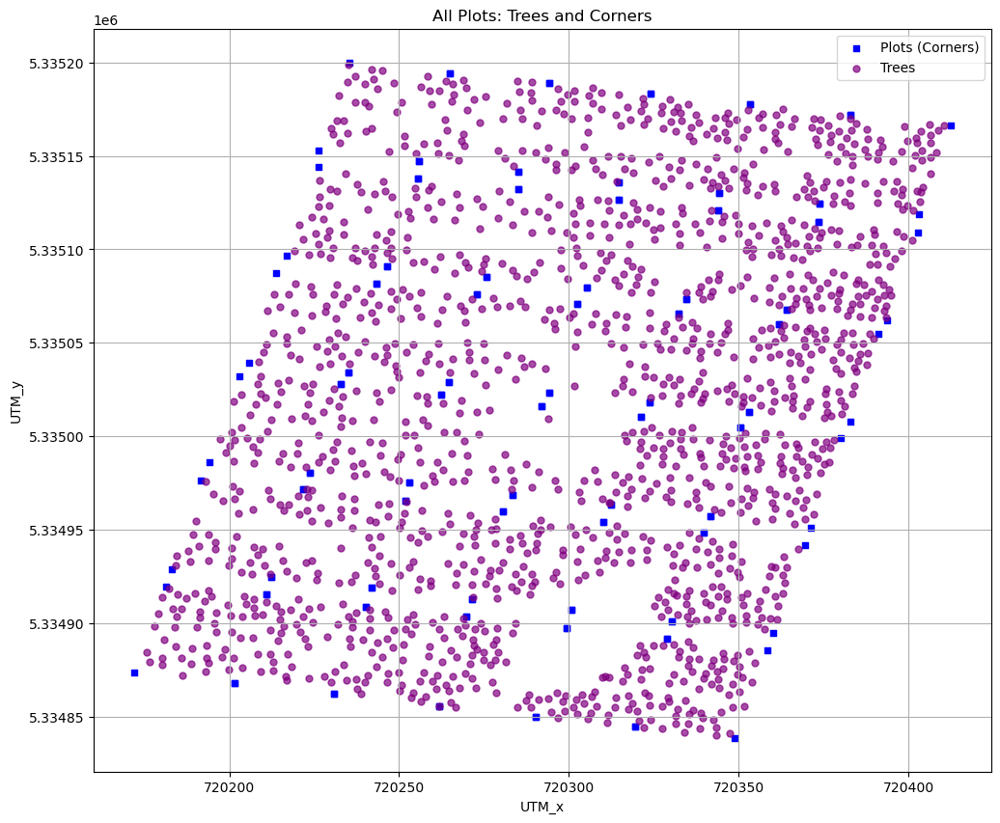

In [8]:
# Transform trees
transformed_trees = transform_trees_all(trees, ground_lines)

# Visualize all Parzellen
visualize_all_plots(corners, transformed_trees)


#### Simple matching of stem coordinates and tree top coordinates

In [9]:
# Perform the matching
matched_trees = match_stems_to_treetops(transformed_trees, tree_top_values, max_distance=2)

# Count matched and unmatched trees
matched_count = sum(1 for tree in matched_trees if tree[4] is not None)
unmatched_count = sum(1 for tree in matched_trees if tree[4] is None)

# Print the results
print(f"Matched trees: {matched_count}")
print(f"Unmatched trees: {unmatched_count}")


Matched trees: 939
Unmatched trees: 580


In [10]:
updated_matches = process_unmatched_stems(matched_trees, tree_top_values, radius=5)

# Count matched and unmatched trees
matched_count = sum(1 for tree in updated_matches if tree[4] is not None)
unmatched_count = sum(1 for tree in updated_matches if tree[4] is None)

# Print the results
print(f"Matched trees: {matched_count}")
print(f"Unmatched trees: {unmatched_count}")


Matched trees: 1027
Unmatched trees: 492


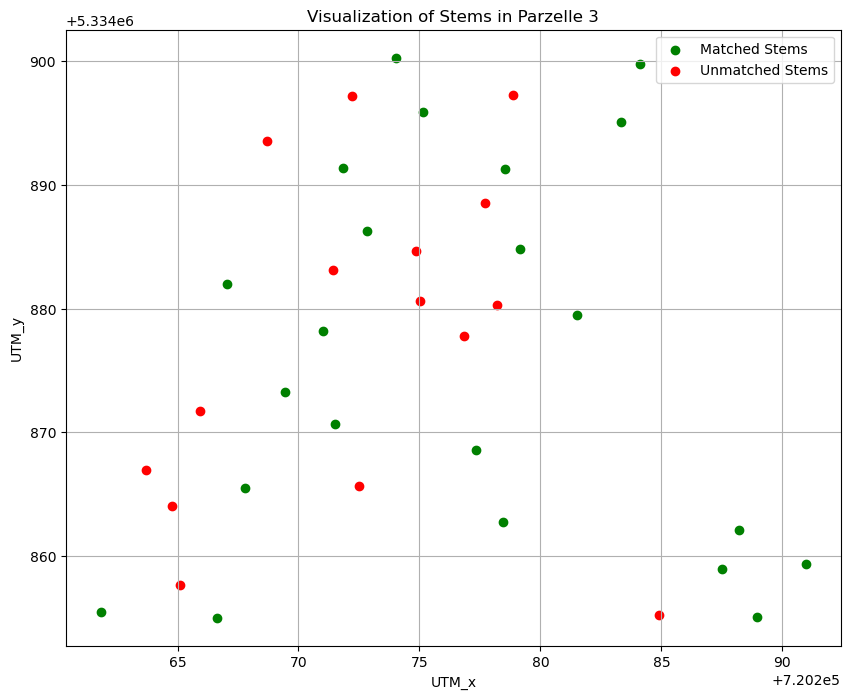

In [11]:
# Visualize individual plots
plot = 3
visualize_matched_trees(updated_matches, plot)  # Visualize for Parzelle 2

#### Visualize matched and unmatched trees

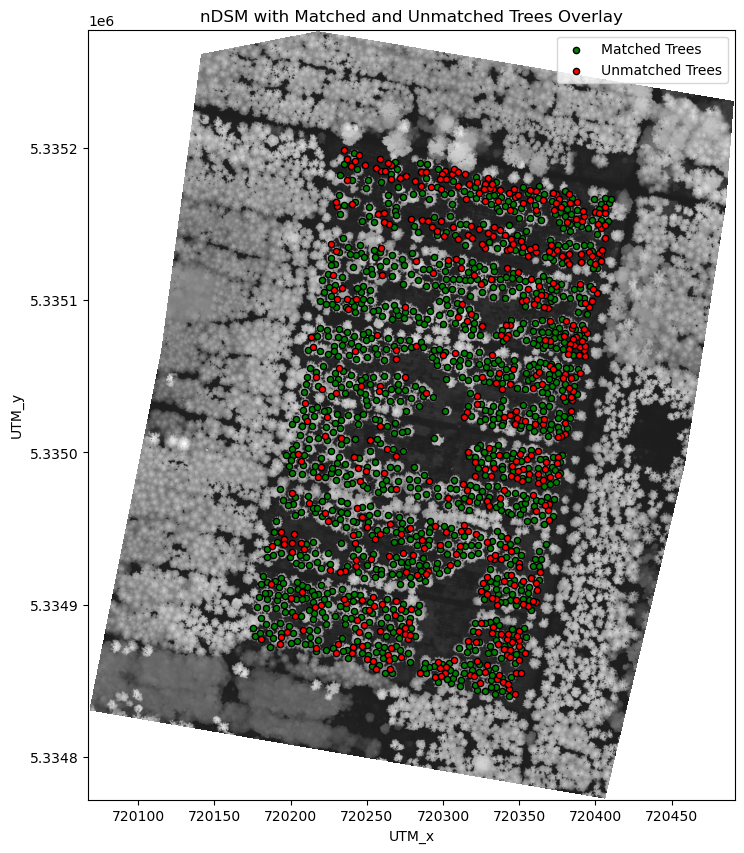

In [12]:
visualize_ndsm_with_trees(output_ndsm, updated_matches)

# Part 2: Sophisticated matching algorithm including marker-based watershed segmentation

#### Markerbased watershed segmentation (includes tree top detection)

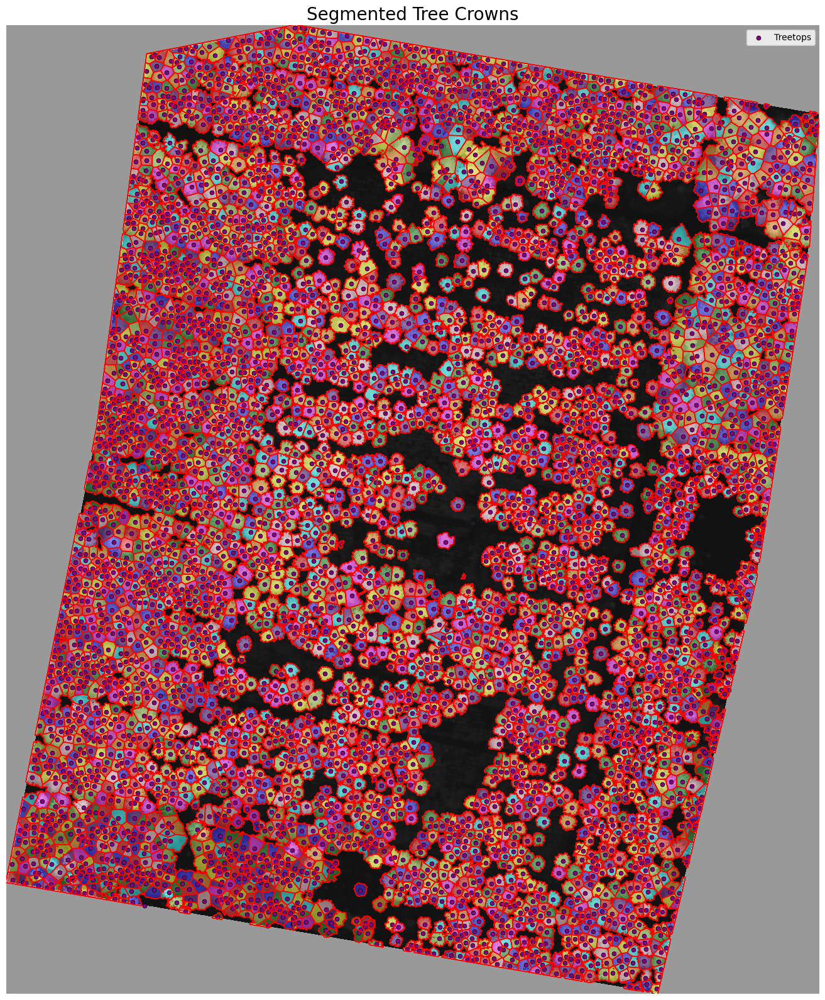

In [13]:
try:
    labels, treetop_coords, ndsm_subset, transform = segment_trees(
        ndsm_path=r"D:\Drohnendaten\TEMP\Baumhoehen\EBE_151_nDSM_clipped_v3.tif",
        ground_threshold=5,
        sigma_for_treetops=10.0,
        sigma_for_segmentation=1,
        min_distance=5,
        threshold_abs=5.0,
        exclude_border=True,
        connectivity=1,
        compactness=0.2,
        watershed_line=False,
        subset_size_meters=100,
        min_area_threshold=1500,
        use_subset=False,
        show_contours=True,
        return_arrays=True
    )
except Exception as e:
    print(f"An error occurred: {e}")


#### Match stems and tree tops within the same segment

#### All stems visualized

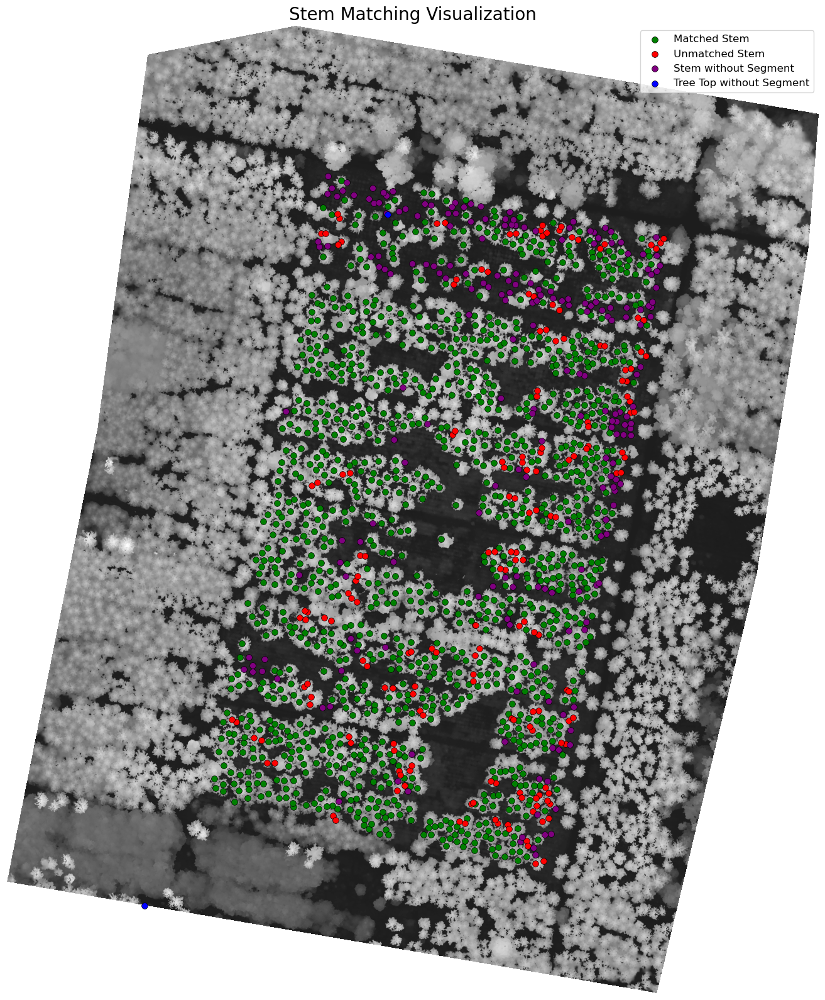

In [31]:

# Call the function
matched_stems = match_and_visualize_all(
    labels=labels,
    treetop_coords=treetop_coords,
    stem_coords=transformed_trees,
    ndsm=ndsm_subset,
    transform=transform
)

# Print matched stems
#for match in matched_stems:
    #print(match)


#### Tree height extracted from the highest pixel within the matched segment 

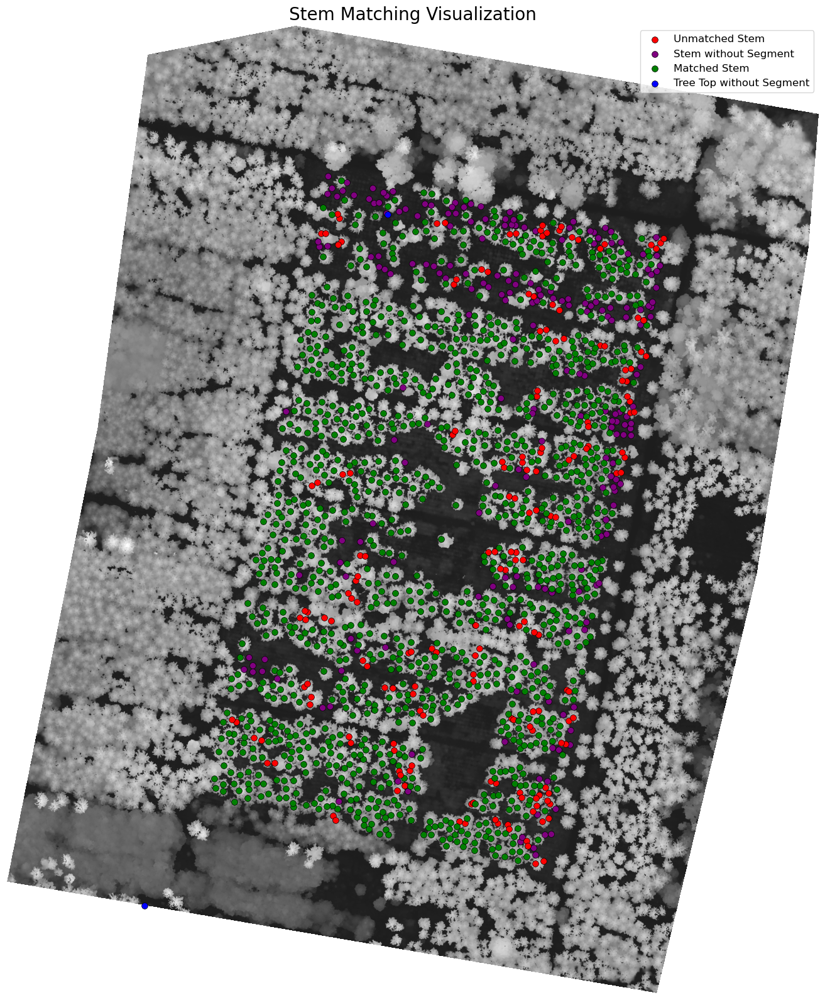

In [32]:
results = match_and_visualize_updated2(
    labels=labels,
    treetop_coords=treetop_coords,
    stem_coords=transformed_trees,
    ndsm=ndsm_subset,
    transform=transform
)

# Print results
#for result in results:
    #print(result)


#### Merge tables and export as .csv

In [30]:
valid_trees = [tree for tree in results if tree["UAV_Tree_Height_segment"] is not None]

if valid_trees:
    highest_tree = max(valid_trees, key=lambda x: x["UAV_Tree_Height_segment"])
    print("Highest Tree:")
    for key, value in highest_tree.items():
        print(f"{key}: {value}")
else:
    print("No valid trees with heights found.")


Highest Tree:
Parzelle: 18
Nr: 1007
Stem_UTM_X: 720227.6923134123
Stem_UTM_Y: 5335013.172683188
Treetop_UTM_X: 720228.0451774653
Treetop_UTM_Y: 5335011.359845788
UAV_Tree_Height_segment: 36.00543212890625
match: 1
UAV_Tree_Height_pixel: 30.99652099609375


In [18]:
# Sort results by "Parzelle" and then by "Nr"
results = sorted(results, key=lambda x: (x["Parzelle"], x["Nr"]))

In [23]:
# Merge results and matched_stems
merged_results = merge_dictionaries(results, matched_stems)

# Print merged results
#for item in merged_results:
#    print(item)


In [25]:
# Desired column order
column_order = [
    "Parzelle",
    "Nr",
    "Stem_UTM_X",
    "Stem_UTM_Y",
    "Treetop_UTM_X",
    "Treetop_UTM_Y",
    "UAV_Tree_Height_segment",
    "UAV_Tree_Height_pixel",
    "match",
]

# Reorder columns
reordered_data = [
    {col: item[col] for col in column_order if col in item} for item in merged_results
]

In [27]:


# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(reordered_data)

# Export to CSV
output_path = r"D:\Drohnendaten\19_W007\uav_tree_height.csv"
df.to_csv(output_path, index=False)

print(f"Data has been exported to {output_path}")


Data has been exported to D:\Drohnendaten\19_W007\uav_tree_height.csv


In [28]:
reordered_data

[{'Parzelle': 1,
  'Nr': 1001,
  'Stem_UTM_X': 720343.2284648679,
  'Stem_UTM_Y': 5334840.049333123,
  'Treetop_UTM_X': None,
  'Treetop_UTM_Y': None,
  'UAV_Tree_Height_segment': None,
  'UAV_Tree_Height_pixel': None,
  'match': 0},
 {'Parzelle': 1,
  'Nr': 1002,
  'Stem_UTM_X': 720347.4499555094,
  'Stem_UTM_Y': 5334841.227898039,
  'Treetop_UTM_X': None,
  'Treetop_UTM_Y': None,
  'UAV_Tree_Height_segment': None,
  'UAV_Tree_Height_pixel': None,
  'match': 0},
 {'Parzelle': 1,
  'Nr': 1003,
  'Stem_UTM_X': 720343.3257155236,
  'Stem_UTM_Y': 5334844.520411584,
  'Treetop_UTM_X': None,
  'Treetop_UTM_Y': None,
  'UAV_Tree_Height_segment': None,
  'UAV_Tree_Height_pixel': None,
  'match': 2},
 {'Parzelle': 1,
  'Nr': 1004,
  'Stem_UTM_X': 720344.7316728459,
  'Stem_UTM_Y': 5334852.398436965,
  'Treetop_UTM_X': 720345.0483182654,
  'Treetop_UTM_Y': 5334852.4780297885,
  'UAV_Tree_Height_segment': 27.107666,
  'UAV_Tree_Height_pixel': 27.106262,
  'match': 1},
 {'Parzelle': 1,
  'Nr': 10